Homework assigment: https://github.com/mdavydov/ComputerVisionCourse/blob/master/hw2022/Module4Task.md

In [ ]:
import os
import io

import cv2 as cv
import numpy as np

from matplotlib import pyplot as plt
from PIL import Image

In [ ]:
# %cd /content/drive/MyDrive/Colab Notebooks/UCU/cv/
# !zip -r 3d_data.zip 3d_data/
# %cd /content

In [ ]:
!pip install -U --no-cache-dir gdown --pre -q

In [ ]:
!gdown 15O36GXEHSQiB-aY-hP8CWUeixHtx7gBV
!unzip 3d_data.zip

Downloading...
From: https://drive.google.com/uc?id=15O36GXEHSQiB-aY-hP8CWUeixHtx7gBV
To: /content/3d_data.zip
100% 12.0M/12.0M [00:00<00:00, 66.5MB/s]
Archive:  3d_data.zip
   creating: 3d_data/
   creating: 3d_data/chessboard/
  inflating: 3d_data/chessboard/photo_2023-01-22_22-31-52.jpg  
  inflating: 3d_data/chessboard/photo_2023-01-22_22-31-56.jpg  
  inflating: 3d_data/chessboard/photo_2023-01-22_22-32-01.jpg  
  inflating: 3d_data/chessboard/photo_2023-01-22_22-32-06.jpg  
  inflating: 3d_data/chessboard/photo_2023-01-22_22-32-10.jpg  
  inflating: 3d_data/chessboard/photo_2023-01-22_22-32-14.jpg  
  inflating: 3d_data/chessboard/photo_2023-01-22_22-32-17.jpg  
  inflating: 3d_data/chessboard/photo_2023-01-22_22-32-22.jpg  
  inflating: 3d_data/chessboard/photo_2023-01-22_22-32-26.jpg  
  inflating: 3d_data/chessboard/photo_2023-01-22_22-32-30.jpg  
  inflating: 3d_data/chessboard/photo_2023-01-22_22-32-34.jpg  
  inflating: 3d_data/book.jpg        
  inflating: 3d_data/book2.jp

In [ ]:
from pathlib import Path

image_dir = Path("3d_data/chessboard")
image_dir.exists()

True

In [ ]:
def plot_images(images, n_rows):
    n_cols = int(np.ceil(len(images) / n_rows))
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 20))
    axes = axes.ravel()
    for i, image in enumerate(images):
        axes[i].imshow(image)
        axes[i].axis('off')
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.show()

def read_folder(folder, ext):
    images = []
    for filename in sorted(os.listdir(folder)):
        if filename.endswith(ext):
            path = os.path.join(folder, filename)
            images.append(np.array(Image.open(path)))
    return images

In [ ]:
images = read_folder(image_dir, '.jpg')
images[0].shape

(1280, 1280, 3)

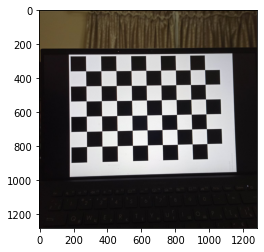

In [ ]:
plt.imshow(images[0])

# Camera calibration

I based my experiments on official [Open CV guidlines](https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_calib3d/py_calibration/py_calibration.html)

There are several types of distortion that can occur when calibrating a camera, but two of the most common types are radial distortion and tangential distortion.

1. Radial distortion: This type of distortion occurs when the image captured by the camera is not a perfect representation of the actual scene. This can be caused by the lens of the camera not being perfectly circular, or by the sensor not being perfectly flat. This results in straight lines appearing curved in the image. Radial distortion can be corrected using a process called radial undistortion.

1. Tangential distortion: This type of distortion occurs when the lens of the camera is not aligned perfectly with the sensor. This can cause the image to appear distorted, with straight lines appearing to be tilted or skewed. Tangential distortion can be corrected using a process called tangential undistortion.

In [ ]:
import cv2
import numpy as np
import glob

class CameraCalibrator:
    def __init__(self, calibration_images_dir, chessboard_size, img_ext='.jpg'):
        self.calibration_images_dir = calibration_images_dir
        self.chessboard_size = chessboard_size
        self.objpoints = []
        self.imgpoints = []
        self.calibrated = False
        self.images = read_folder(calibration_images_dir, img_ext)

    def calibrate(self, verbose=False, rows=3):
        # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
        objp = np.zeros((self.chessboard_size[1]*self.chessboard_size[0],3), np.float32)
        objp[:,:2] = np.mgrid[0:self.chessboard_size[0], 0:self.chessboard_size[1]].T.reshape(-1,2)

        # find corners in all calibration images
        images = self.images
        to_draw_corners = []
        for img in images:
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

            # find chessboard corners
            ret, corners = cv2.findChessboardCorners(gray, self.chessboard_size, None)

            # if corners are found, add object points and image points
            if ret:
                self.objpoints.append(objp)
                self.imgpoints.append(corners)
            
            if verbose:
                to_draw_corners.append(cv.drawChessboardCorners(cv.cvtColor(gray, cv.COLOR_GRAY2RGB), self.chessboard_size, corners, ret))
        
        if verbose:
            plot_images(to_draw_corners, rows)

        # calibrate camera
        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(self.objpoints, self.imgpoints, gray.shape[::-1], None, None)

        self.mtx = mtx
        self.dist = dist
        self.calibrated = True

    def undistort(self, img):
        if not self.calibrated:
            raise Exception("Camera must be calibrated before undistorting images")

        return cv2.undistort(img, self.mtx, self.dist, None, self.mtx)


In [ ]:
camera_calibrator = CameraCalibrator(image_dir, (6,9))

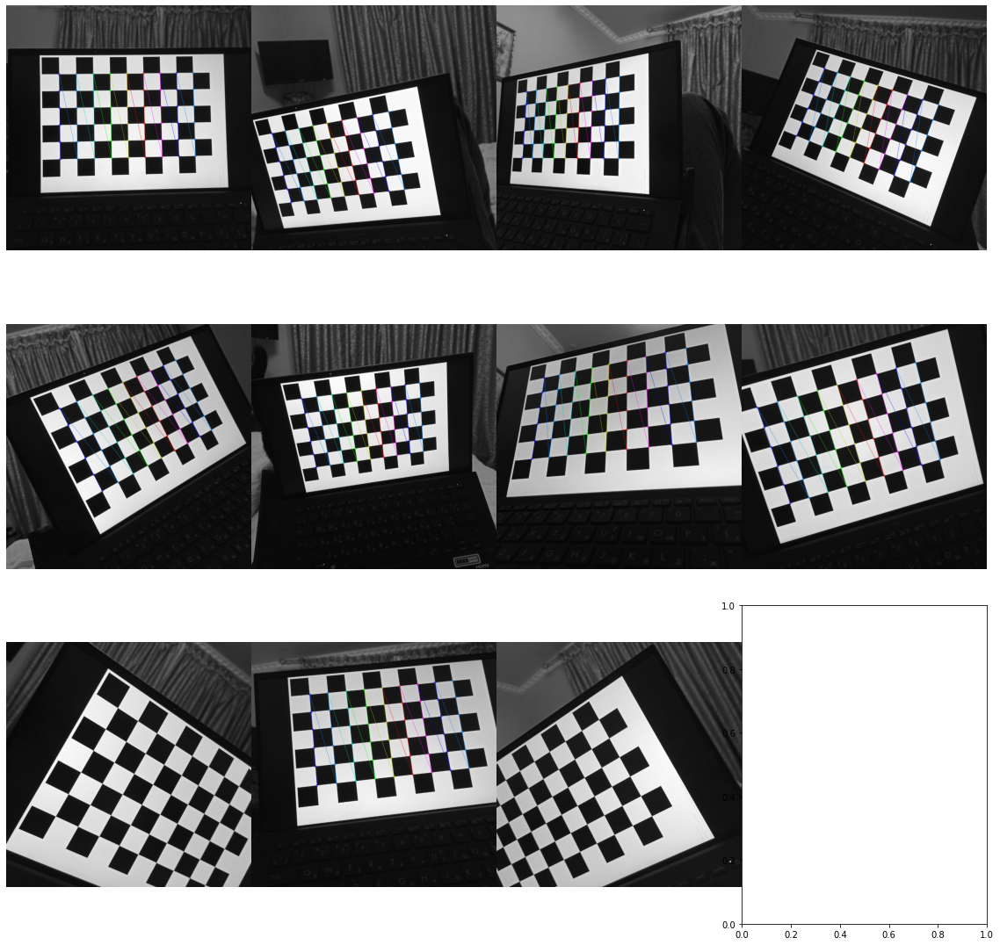

In [ ]:
camera_calibrator.calibrate(verbose=True, rows=3)

In [ ]:
camera_calibrator.mtx

array([[1.28264983e+03, 0.00000000e+00, 6.21636385e+02],
       [0.00000000e+00, 1.28379634e+03, 6.38618398e+02],
       [0.00000000e+00, 0.00000000e+00, 1.00000000e+00]])

## Test camera calibration

In [ ]:
book_file = Path("3d_data/book2.jpg")
book_file.exists()

True

(1280, 1280, 3)


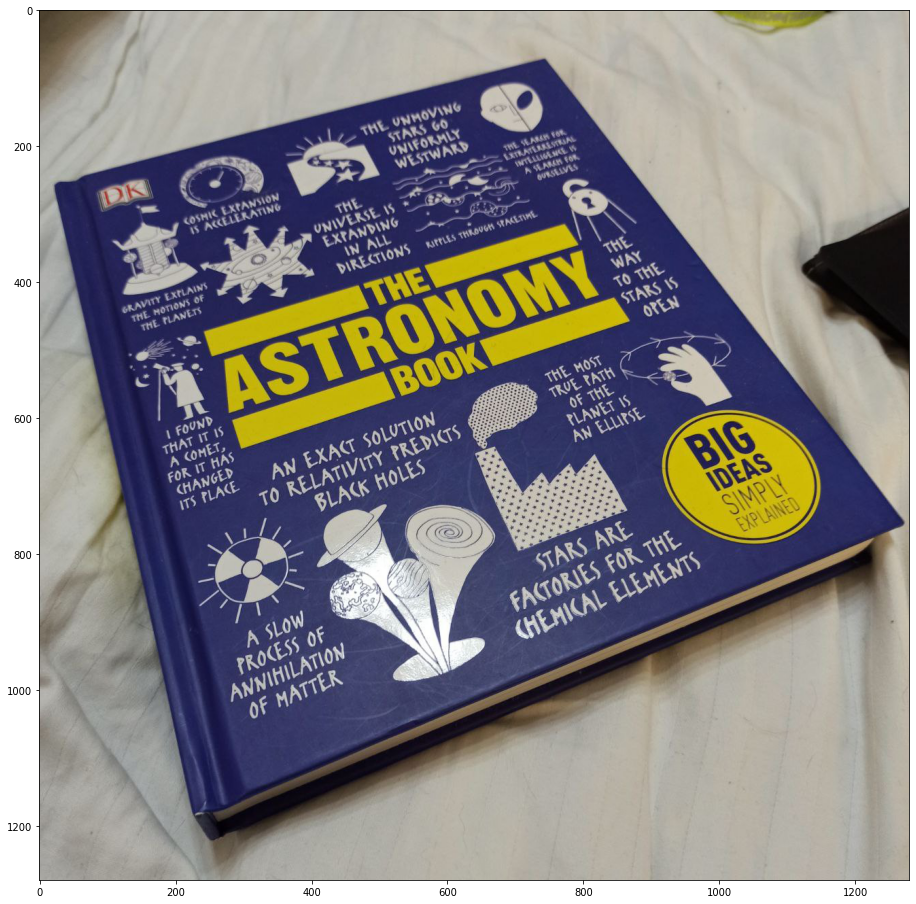

In [ ]:
distorted_img = np.array(Image.open(book_file))
print(distorted_img.shape)

plt.figure(figsize=(16,16))
plt.imshow(distorted_img)
plt.savefig('default.png')

In [ ]:
# Image.fromarray(undistorted_img).save('undistorted_img.png')

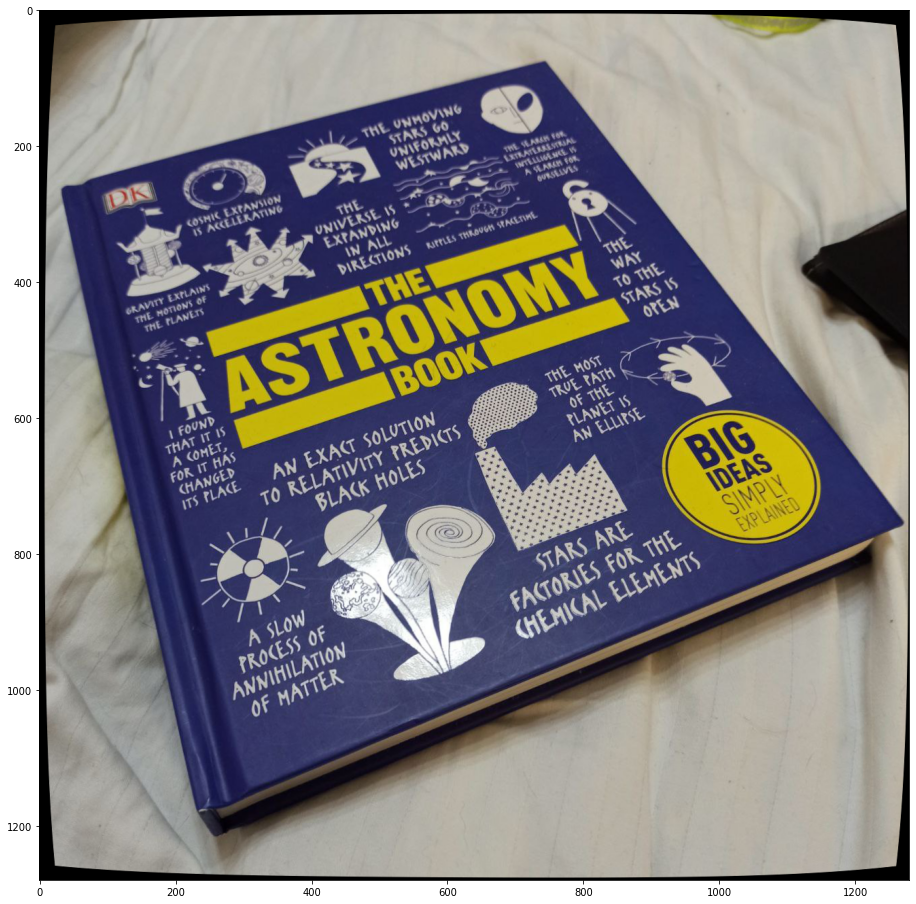

In [ ]:
img = camera_calibrator.undistort(distorted_img)

plt.figure(figsize=(16,16))
plt.imshow(img)
plt.savefig('undistorted.png')

In [ ]:
def draw_points_on_image(image, points, figsize=(5,5)):
    plt.figure(figsize=figsize)
    plt.imshow(image)
    plt.scatter(*zip(*points), c='r', s=30)
    plt.show()

In [ ]:
pts1 = np.float32([[36, 263], [744, 77],[1270, 754],[233, 1175]])
pts2 = np.float32([[0,0],[300,0], [300,400], [0,400] ])
# draw_points_on_image(undistorted_img, pts1, (16,16))

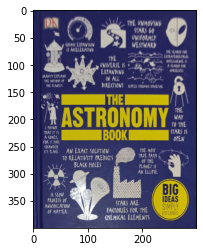

In [ ]:
M = cv2.getPerspectiveTransform(pts1,pts2)
dst = cv2.warpPerspective(img,M,(300, 400))
plt.imshow(dst)

Estimated calibration matrix:
 (1318.4, 0, 640.0) 
 (0, 1318.4, 640.0) 
 (0, 0, 1)


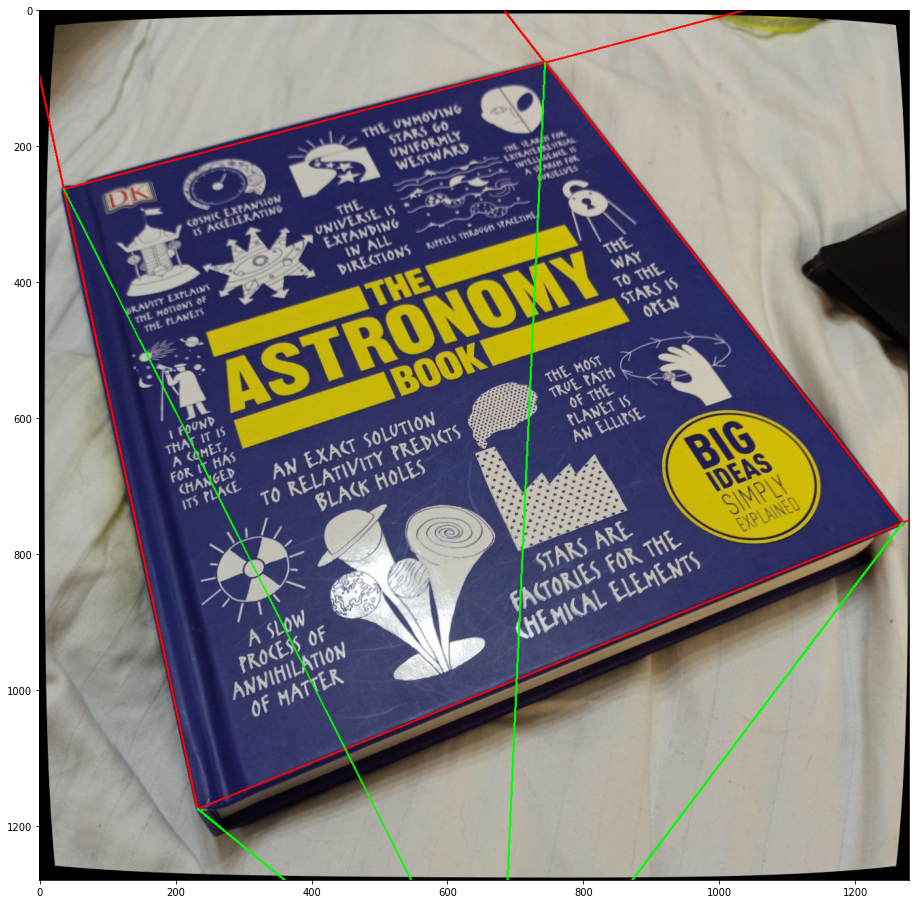

In [ ]:
# find lines
lines = np.zeros( (4,3), np.double )

for i in range(0,4):
  lines[i] = np.cross( [pts1[i,0],pts1[i,1],1], [pts1[i-1,0],pts1[i-1,1],1] )
  lines[i] /= np.linalg.norm(lines[i,0:2])

# intersect pairs

p1 = np.cross( lines[0], lines[2] )
p2 = np.cross( lines[1], lines[3] )

img2 = img.copy()

def line(img, p1, p2, color):
  cv2.line(img, (int(p1[0]), int(p1[1])), (int(p2[0]), int(p2[1])), color, 2 )

line(img2, pts1[3], p1/p1[2], (255,0,0) )
line(img2, pts1[2], p1/p1[2], (255,0,0) )
line(img2, pts1[0], p2/p2[2], (255,0,0) )
line(img2, pts1[3], p2/p2[2], (255,0,0) )

(h,w) = img.shape[0:2]
#print(f)

# search for calibration matrix that makes p1 and p2
# orthogonal in camera space
def p3_candidate(i):
  f = max( w,h ) * i / 100
  K = ( (f, 0, w/2),
        (0, f, h/2),
        (0, 0,   1),
      )
  # convert axis intersection points to camera coordinates
  invK = np.linalg.inv(K)
  p1_c = invK @ p1
  p2_c = invK @ p2
  cosa = abs( (p1_c @ p2_c) / (np.linalg.norm(p1_c) * np.linalg.norm(p2_c)) )
  p3_c = np.cross(p1_c, p2_c)
  #convert to image space
  p3 = K @ p3_c
  return (cosa, p3, K)

p3_list = [p3_candidate(i) for i in range(50, 200)]

(cosa, p3, K) = min(p3_list)

print("Estimated calibration matrix:\n", K[0], "\n", K[1], "\n", K[2])

# draw lines orthogonal to the book surface
for i in range(0,4):
  line(img2, pts1[i], p3/p3[2], (0,255,0) )

plt.figure(figsize=(16,16))
plt.imshow(img2)

Estimated calibration matrix:
 (1282.6498338848148, 0, 621.6363847417996) 
 (0, 1282.6498338848148, 638.618397542142) 
 (0, 0, 1)


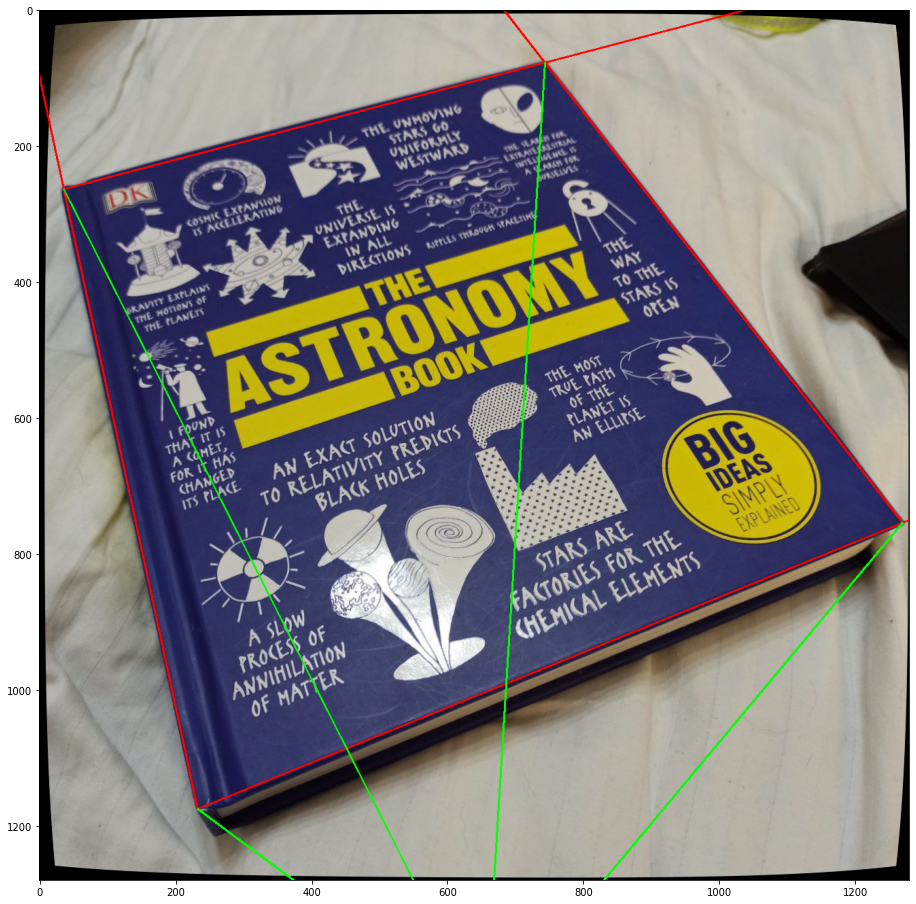

In [ ]:
# find lines
lines = np.zeros( (4,3), np.double )

for i in range(0,4):
  lines[i] = np.cross( [pts1[i,0],pts1[i,1],1], [pts1[i-1,0],pts1[i-1,1],1] )
  lines[i] /= np.linalg.norm(lines[i,0:2])

# intersect pairs

p1 = np.cross( lines[0], lines[2] )
p2 = np.cross( lines[1], lines[3] )

img2 = img.copy()

def line(img, p1, p2, color):
  cv2.line(img, (int(p1[0]), int(p1[1])), (int(p2[0]), int(p2[1])), color, 2 )

line(img2, pts1[3], p1/p1[2], (255,0,0) )
line(img2, pts1[2], p1/p1[2], (255,0,0) )
line(img2, pts1[0], p2/p2[2], (255,0,0) )
line(img2, pts1[3], p2/p2[2], (255,0,0) )

(h,w) = img.shape[0:2]
#print(f)

# search for calibration matrix that makes p1 and p2
# orthogonal in camera space
def p3_candidate(K):
  f = K[0,0]
  w = K[0,2]
  h = K[1,2]
  K = ( (f, 0, w),
        (0, f, h),
        (0, 0,   1),
      )
  # convert axis intersection points to camera coordinates
  invK = np.linalg.inv(K)
  p1_c = invK @ p1
  p2_c = invK @ p2
  cosa = abs( (p1_c @ p2_c) / (np.linalg.norm(p1_c) * np.linalg.norm(p2_c)) )
  p3_c = np.cross(p1_c, p2_c)
  #convert to image space
  p3 = K @ p3_c
  return (cosa, p3, K)

(cosa, p3, K) = p3_candidate(camera_calibrator.mtx)

print("Estimated calibration matrix:\n", K[0], "\n", K[1], "\n", K[2])

# draw lines orthogonal to the book surface
for i in range(0,4):
  line(img2, pts1[i], p3/p3[2], (0,255,0) )

plt.figure(figsize=(16,16))
plt.imshow(img2)

Summary: The experiment with camera calibration and the output of undistortion results is difficult to evaluate, because no difference is visible.

In the task of comparing two calibration matrix search algorithms, I would prefer a method in which many images participate in the construction of the matrix, i.e. big number of points from different views, because this gives a more accurate estimation than just 4 points in average.

# Fundamental matrices and epipolar lines

In [ ]:
building_dir = Path("3d_data/building")
building_dir.exists()

True

In [ ]:
building_images = read_folder(building_dir, '.jpg')
building_images[0].shape

(1280, 1280, 3)

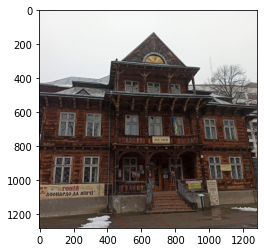

In [ ]:
plt.imshow(building_images[0])

In [ ]:
undistorted_building_imgs = [camera_calibrator.undistort(i) for i in building_images]

In [ ]:
Image.fromarray(undistorted_building_imgs[1]).save('undistorted_building.png')

In [ ]:
def draw_points_on_image(image, points, figsize=(5,5)):
    plt.figure(figsize=figsize)
    plt.imshow(image)
    plt.scatter(*zip(*points), c='r', s=30)
    plt.show()

In [ ]:
stereo_pair = {
    'image1': {
        'image': undistorted_building_imgs[0], #cv2.cvtColor(, cv2.COLOR_BGR2GRAY),
        'pts': np.float32([[132, 600, 1], 
                            [215, 607, 1],
                            [205, 736,1],
                            [120, 730,1],
                           
                            [969, 640,1],
                            [1029, 642,1],
                            [1042, 756,1],
                            [981, 751,1]])
    },
    'image2':{
        'image': undistorted_building_imgs[1], #cv2.cvtColor(undistorted_building_imgs[1], cv2.COLOR_BGR2GRAY),
        'pts': np.float32([[122, 678,1],
                            [169, 674,1], 
                            [158, 777,1],
                            [108, 781,1],
                           
                            [819, 609,1],
                            [890, 600,1],
                            [897, 728,1],
                            [823, 731,1]])
    }
}

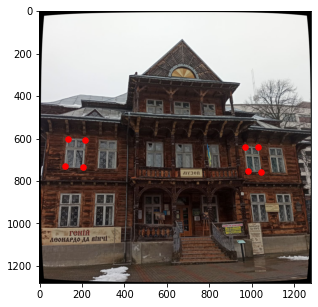

In [ ]:
draw_points_on_image(stereo_pair['image1']['image'], stereo_pair['image1']['pts'][:, :2], (5,5))

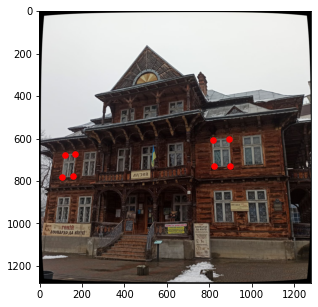

In [ ]:
draw_points_on_image(stereo_pair['image2']['image'], stereo_pair['image2']['pts'][:, :2], (5,5))

## Choose 8 matching points liying on the same plane (for example the front plane of the building). Find fundamental matrix and visualize epipolar lines and epipoles using this set of points.

In [ ]:
def compute_fundamental_matrix(points1, points2):
    '''
    Compute the fundamental matrix given the point correspondences
    
    Parameters
    ------------
    points1, points2 - array with shape [n, 3]
        corresponding points in images represented as 
        homogeneous coordinates
    '''
    # validate points
    assert points1.shape[0] == points2.shape[0], "no. of points don't match"
    
    u1 = points1[:, 0]
    v1 = points1[:, 1]
    u2 = points2[:, 0]
    v2 = points2[:, 1]
    one = np.ones_like(u1)
    
    # construct the matrix 
    # A = [u2.u1, u2.v1, u2, v2.u1, v2.v1, v2, u1, v1, 1] for all the points
    # stack columns
    A = np.c_[u1 * u2, v1 * u2, u2, u1 * v2, v1 * v2, v2, u1, v1, one]
    
    # peform svd on A and find the minimum value of |Af|
    U, S, V = np.linalg.svd(A, full_matrices=True)
    f = V[-1, :]
    F = f.reshape(3, 3) # reshape f as a matrix
    
    # constrain F
    # make rank 2 by zeroing out last singular value
    U, S, V = np.linalg.svd(F, full_matrices=True)
    S[-1] = 0 # zero out the last singular value
    F = U @ np.diag(S) @ V
    return F

def compute_fundamental_matrix_normalized(points1, points2):
    '''
    Normalize points by calculating the centroid, subtracting 
    it from the points and scaling the points such that the distance 
    from the origin is sqrt(2)
    
    Parameters
    ------------
    points1, points2 - array with shape [n, 3]
        corresponding points in images represented as 
        homogeneous coordinates
    '''
    # validate points
    assert points1.shape[0] == points2.shape[0], "no. of points don't match"
    
    # compute centroid of points
    c1 = np.mean(points1, axis=0)
    c2 = np.mean(points2, axis=0)
    
    # compute the scaling factor
    s1 = np.sqrt(2 / np.mean(np.sum((points1 - c1) ** 2, axis=1)))
    s2 = np.sqrt(2 / np.mean(np.sum((points2 - c2) ** 2, axis=1)))
    
    # compute the normalization matrix for both the points
    T1 = np.array([
        [s1, 0, -s1 * c1[0]],
        [0, s1, -s1 * c1[1]],
        [0, 0 ,1]
    ])
    T2 = np.array([
        [s2, 0, -s2 * c2[0]],
        [0, s2, -s2 * c2[1]],
        [0, 0, 1]
    ])
    
    # normalize the points
    points1_n = T1 @ points1.T
    points2_n = T2 @ points2.T
    
    # compute the normalized fundamental matrix
    F_n = compute_fundamental_matrix(points1_n.T, points2_n.T)
    
    # de-normalize the fundamental
    return T2.T @ F_n @ T1

In [ ]:
# # Compute the essential matrix
# E, mask = cv2.findEssentialMat(stereo_pair['image1']['pts'], stereo_pair['image2']['pts'], focal=1.0, pp=(0., 0.), method=cv2.RANSAC, prob=0.999, threshold=1.0)

# # Decompose the essential matrix
# _, R, t, mask = cv2.recoverPose(E, stereo_pair['image1']['pts'], stereo_pair['image2']['pts'])

# # Compute the fundamental matrix
K = camera_calibrator.mtx
F = compute_fundamental_matrix_normalized(stereo_pair['image1']['pts'],  stereo_pair['image2']['pts'])# np.dot(np.dot(np.transpose(K), np.transpose(R)), np.linalg.inv(K))

# Compute the epipoles
e1 = cv2.computeCorrespondEpilines(stereo_pair['image1']['pts'].reshape(-1,1,2), 2, F)
e2 = cv2.computeCorrespondEpilines(stereo_pair['image2']['pts'].reshape(-1,1,2), 1, F)

In [ ]:
img1 = stereo_pair['image1']['image']
img2 = stereo_pair['image2']['image']

for i in range(8):
    if e1[i][0][1]!=0:
        img1 = cv2.line(img1, (0, int(-e1[i][0][2]/e1[i][0][1])), (img1.shape[1], int((-e1[i][0][2]-e1[i][0][0]*img1.shape[1])/e1[i][0][1])), (0,255,0), 1)

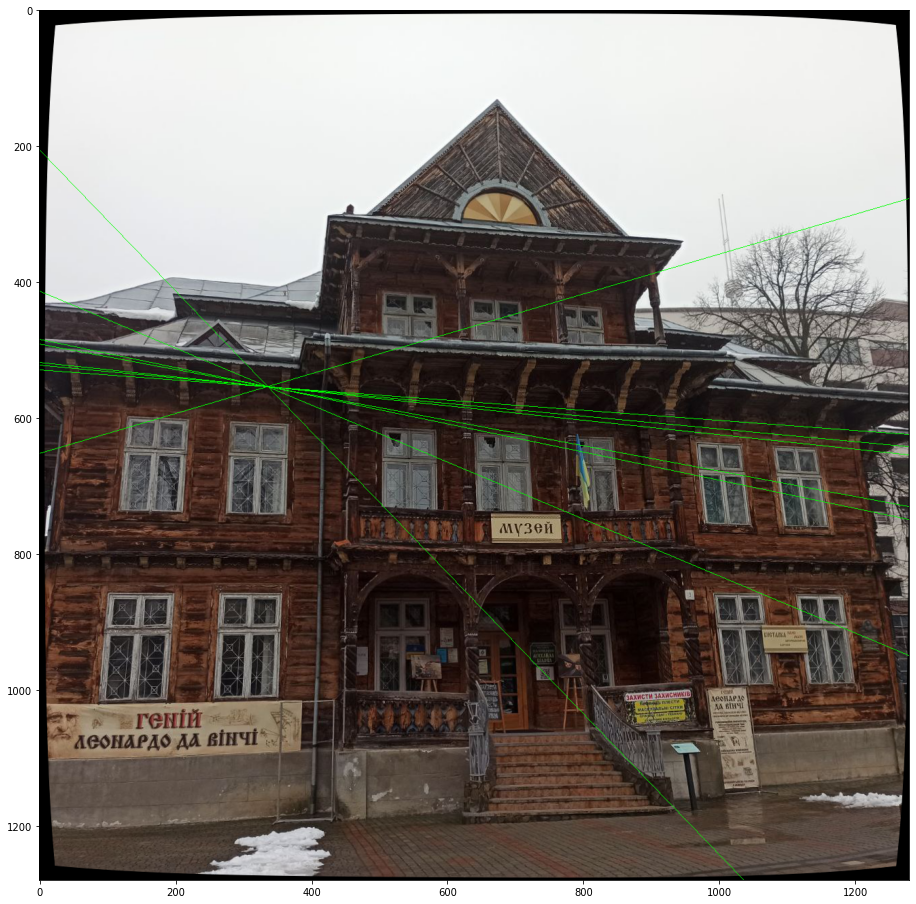

In [ ]:
plt.figure(figsize=(16,16))
plt.imshow(stereo_pair['image1']['image'])

## Choose 8 matching points NOT liying on the same plane (take them from different sides of building, for example 4 from one side and 4 from another). Find fundamental matrix and visualize epipolar lines and epipoles using this set of points.

In [ ]:
building_dir = Path("3d_data/building")

building_images = read_folder(building_dir, '.jpg')

undistorted_building_imgs = [camera_calibrator.undistort(i) for i in building_images]

different_planes_stereo_pair = {
    'image1': {
        'image': undistorted_building_imgs[0], #cv2.cvtColor(, cv2.COLOR_BGR2GRAY),
        'pts': np.float32([[132, 600, 1], 
                            [215, 607, 1],
                            [205, 736,1],
                            [120, 730,1],
                           
                            [930, 1080,1],
                            [961, 1079,1],
                            [972, 1091,1],
                            [940, 1093,1]
                           ])
    },
    'image2':{
        'image': undistorted_building_imgs[1], #cv2.cvtColor(undistorted_building_imgs[1], cv2.COLOR_BGR2GRAY),
        'pts': np.float32([[122, 678,1],
                            [169, 674,1], 
                            [158, 777,1],
                            [108, 781,1],
                           
                            [548, 1081,1],
                            [580, 1081,1],
                            [571, 1093,1],
                            [540, 1093,1]])
    }
}

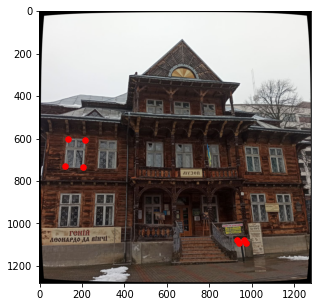

In [ ]:
draw_points_on_image(different_planes_stereo_pair['image1']['image'], different_planes_stereo_pair['image1']['pts'][:, :2], (5,5))

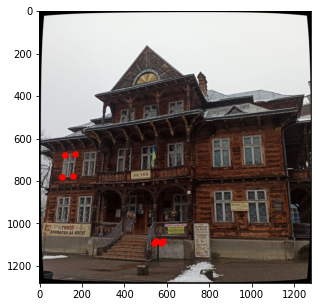

In [ ]:
draw_points_on_image(different_planes_stereo_pair['image2']['image'], different_planes_stereo_pair['image2']['pts'][:, :2], (5,5))

In [ ]:
F = compute_fundamental_matrix_normalized(different_planes_stereo_pair['image1']['pts'],  different_planes_stereo_pair['image2']['pts'])# np.dot(np.dot(np.transpose(K), np.transpose(R)), np.linalg.inv(K))

# Compute the epipoles
e1 = cv2.computeCorrespondEpilines(different_planes_stereo_pair['image1']['pts'].reshape(-1,1,2), 2, F)
e2 = cv2.computeCorrespondEpilines(different_planes_stereo_pair['image2']['pts'].reshape(-1,1,2), 1, F)

In [ ]:
img1 = np.copy(different_planes_stereo_pair['image1']['image'])
img2 = np.copy(different_planes_stereo_pair['image2']['image'])

for i in range(8):
    if e1[i][0][1]!=0:
        img1 = cv2.line(img1, (0, int(-e1[i][0][2]/e1[i][0][1])), (img1.shape[1], int((-e1[i][0][2]-e1[i][0][0]*img1.shape[1])/e1[i][0][1])), (0,255,0), 1)
    if e2[i][0][1]!=0:
        img2 = cv2.line(img2, (0, int(-e2[i][0][2]/e2[i][0][1])), (img2.shape[1], int((-e2[i][0][2]-e2[i][0][0]*img2.shape[1])/e2[i][0][1])), (0,255,0), 1)

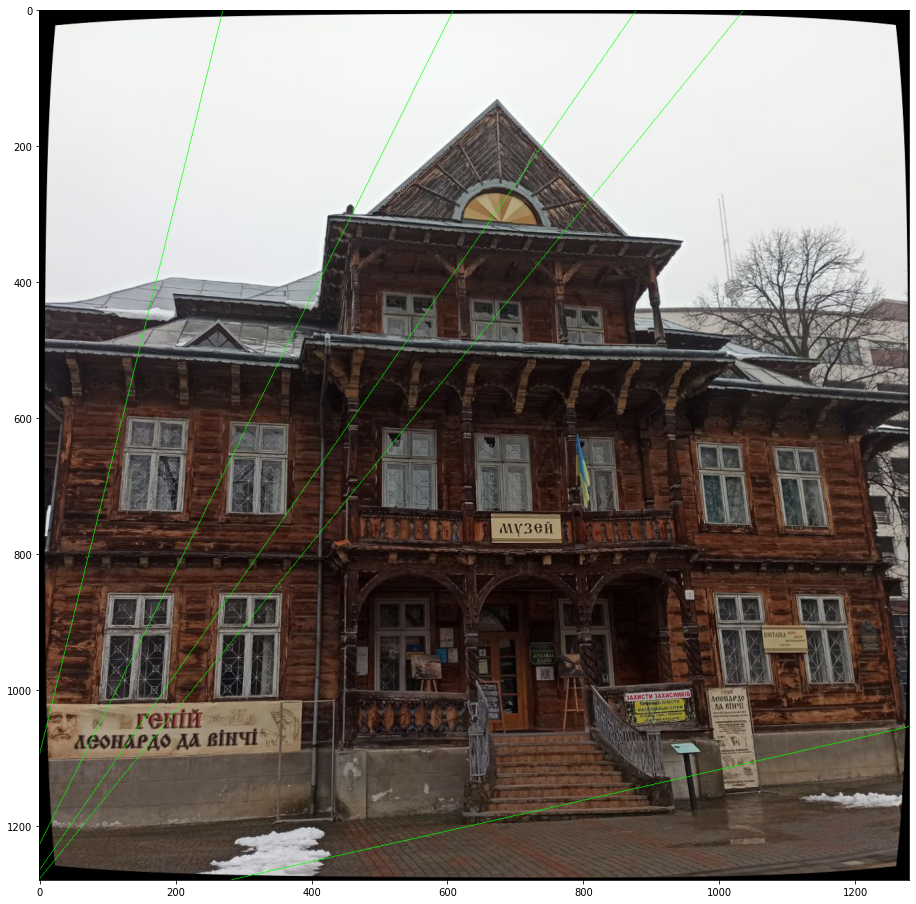

In [ ]:
plt.figure(figsize=(16,16))
plt.imshow(img1)

## Find essential matrix using 5-point method. Calculate fundamental matrix using essential matrix and camera calibration matrices. Visualize epipolar lines and epipoles using this method

**IMPORTANT**: I decided to skip this task due complexity and time limit. =( 

In [ ]:
import numpy as np

def findEssentialMat(points1, points2, focal=1.0, pp=(0, 0)):
    # Normalize the points
    points1 = points1 / focal
    points2 = points2 / focal
    pp = np.array(pp) / focal
    
    # Compute the centered points
    centered_points1 = points1 - pp
    centered_points2 = points2 - pp
    
    # Compute the 5-point algorithm
    x1 = centered_points1[:, 0]
    y1 = centered_points1[:, 1]
    x2 = centered_points2[:, 0]
    y2 = centered_points2[:, 1]
    A = np.array([x1*x2, x1*y2, x1, y1*x2, y1*y2, y1, x2, y2, np.ones(5)])
    U, S, V = np.linalg.svd(A)
    E = V[-1].reshape(3, 3)

    # Enforce rank 2 constraint
    U, S, V = np.linalg.svd(E)
    S[2] = 0
    E = np.dot(U, np.dot(np.diag(S), V))
    return E

In [ ]:
building_dir = Path("3d_data/building")

building_images = read_folder(building_dir, '.jpg')

undistorted_building_imgs = [camera_calibrator.undistort(i) for i in building_images]

different_planes_stereo_pair = {
    'image1': {
        'image': undistorted_building_imgs[0], #cv2.cvtColor(, cv2.COLOR_BGR2GRAY),
        'pts': np.float32([[132, 600, 1], 
                            [215, 607, 1],
                            [205, 736,1],
                            [120, 730,1],
                            [171, 645,1]])
    },
    'image2':{
        'image': undistorted_building_imgs[1], #cv2.cvtColor(undistorted_building_imgs[1], cv2.COLOR_BGR2GRAY),
        'pts': np.float32([[122, 678,1],
                            [169, 674,1], 
                            [158, 777,1],
                            [108, 781,1],
                            [142, 708,1]])
    }
}

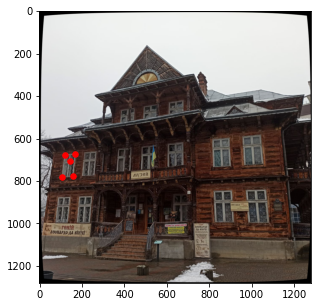

In [ ]:
draw_points_on_image(different_planes_stereo_pair['image2']['image'], different_planes_stereo_pair['image2']['pts'][:, :2], (5,5))

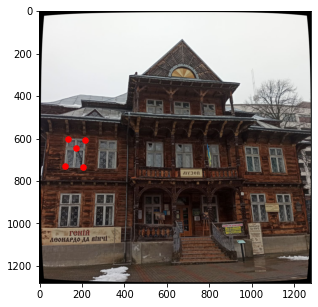

In [ ]:
draw_points_on_image(different_planes_stereo_pair['image1']['image'], different_planes_stereo_pair['image1']['pts'][:, :2], (5,5))

In [ ]:
different_planes_stereo_pair['image1']['pts'][:3, :2].shape

(4, 2)

In [ ]:
E = findEssentialMat(different_planes_stereo_pair['image1']['pts'][:4, :2], different_planes_stereo_pair['image2']['pts'][:4, :2])

## Summary

In general, I want to say, that second way to find dundamental matrix taking essential and calibration matrices into account looks like more correct way, because we made calibration preprocessing before and this information looks more robust, that baked in raw fundamental matrix.

# 3D reconstruction using 2-view SfM

Honestly, I took many code snippets from the internet. I made few iterations to finish this task, but always failed with some bug in the code.

In [ ]:
from tqdm import tqdm
import cv2

In [ ]:
!gdown 1dKdBmCWLos-ABuUnMiXrCY8hXqwxDG8S
!unzip -o working_place.zip

Downloading...
From: https://drive.google.com/uc?id=1dKdBmCWLos-ABuUnMiXrCY8hXqwxDG8S
To: /content/working_place.zip
100% 1.52M/1.52M [00:00<00:00, 98.2MB/s]
Archive:  working_place.zip
  inflating: working_place/0.jpg     
  inflating: working_place/1.jpg     
  inflating: working_place/2.jpg     
  inflating: working_place/3.jpg     
  inflating: working_place/4.jpg     
  inflating: working_place/5.jpg     
  inflating: working_place/6.jpg     
  inflating: working_place/7.jpg     
  inflating: working_place/8.jpg     
  inflating: working_place/K.txt     


In [ ]:
def load_camera_calibration_mat(txt_path):
    # loading the Camera intrinsic parameters K
    with open(txt_path) as f:
        return np.array(list((map(lambda x:list(map(lambda x:float(x), x.strip().split(' '))),f.read().split('\n')))))

sift = cv2.xfeatures2d.SIFT_create()

def find_features(image_0, image_1, threshold=0.7):
    # Extract keypoints and descriptors from the images using SIFT
    kp1, des1 = sift.detectAndCompute(image_0, None)
    kp2, des2 = sift.detectAndCompute(image_1, None)

    # Match the keypoints using a descriptor matcher
    bf = cv2.BFMatcher()
    matches = bf.knnMatch(des1, des2, k=2)

    # Filter matches using the Lowe's ratio test
    good_matches = []
    for m, n in matches:
        if m.distance < threshold * n.distance:
            good_matches.append(m)

    # Extract the matching keypoints from the images
    src_pts = np.float32([kp1[m.queryIdx].pt for m in good_matches])
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in good_matches])

    return src_pts, dst_pts

def triangulation(point_2d_1, point_2d_2, projection_matrix_1, projection_matrix_2):
    pt_cloud = cv2.triangulatePoints(point_2d_1, point_2d_2, projection_matrix_1.T, projection_matrix_2.T)
    return projection_matrix_1.T, projection_matrix_2.T, (pt_cloud / pt_cloud[3])  

def PnP(obj_point, image_point , K, dist_coeff, rot_vector, initial):
    if initial == 1:
        obj_point = obj_point[:, 0 ,:]
        image_point = image_point.T
        rot_vector = rot_vector.T
    success, rot_vector_calc, tran_vector, _ = cv2.solvePnPRansac(obj_point, image_point, K, dist_coeff, flags=cv2.SOLVEPNP_ITERATIVE)
    rot_matrix, _ = cv2.Rodrigues(rot_vector_calc)
    return rot_matrix, tran_vector, image_point, obj_point, rot_vector

def common_points(image_points_1, image_points_2, image_points_3) -> tuple:
    cm_points_1 = []
    cm_points_2 = []
    for i in range(image_points_1.shape[0]):
        a = np.where(image_points_2 == image_points_1[i, :])
        if a[0].size != 0:
            cm_points_1.append(i)
            cm_points_2.append(a[0][0])

    # Create a boolean mask for common points in image_points_2
    mask = np.isin(np.arange(image_points_2.shape[0]), cm_points_2, invert=True)
    mask_array_1 = image_points_2[mask]
    mask = np.isin(np.arange(image_points_3.shape[0]), cm_points_2, invert=True)
    mask_array_2 = image_points_3[mask]
    return np.array(cm_points_1), np.array(cm_points_2), mask_array_1, mask_array_2

def to_ply(path, point_cloud, colors) -> None:
    out_points = point_cloud.reshape(-1, 3) * 200
    out_colors = colors.reshape(-1, 3)
    print(out_colors.shape, out_points.shape)
    verts = np.hstack([out_points, out_colors])

    mean = np.mean(verts[:, :3], axis=0)
    scaled_verts = verts[:, :3] - mean
    dist = np.sqrt(scaled_verts[:, 0] ** 2 + scaled_verts[:, 1] ** 2 + scaled_verts[:, 2] ** 2)
    indx = np.where(dist < np.mean(dist) + 300)
    verts = verts[indx]
    ply_header = '''ply
        format ascii 1.0
        element vertex %(vert_num)d
        property float x
        property float y
        property float z
        property uchar blue
        property uchar green
        property uchar red
        end_header
        '''
    with open(path, 'w') as f:
        f.write(ply_header % dict(vert_num=len(verts)))
        np.savetxt(f, verts, '%f %f %f %d %d %d')

In [ ]:
K = load_camera_calibration_mat('/content/working_place/K.txt')
images = read_folder('/content/working_place/', '.jpg')
K

array([[1.28264e+03, 0.00000e+00, 6.21630e+02],
       [0.00000e+00, 1.28379e+03, 6.38610e+02],
       [0.00000e+00, 0.00000e+00, 1.00000e+00]])

In [ ]:
pose_array = K.ravel()
transform_matrix_0 = np.array([[1, 0, 0, 0], [0, 1, 0, 0], [0, 0, 1, 0]])
transform_matrix_1 = np.empty((3, 4))

pose_0 = np.matmul(K, transform_matrix_0)
pose_1 = np.empty((3, 4)) 
total_points = np.zeros((1, 3))
total_colors = np.zeros((1, 3))

image_0 = images[0]
image_1 = images[1]

feature_0, feature_1 = find_features(image_0, image_1)

# Essential matrix
essential_matrix, em_mask = cv2.findEssentialMat(feature_0, feature_1, K, method=cv2.RANSAC, prob=0.999, threshold=0.4, mask=None)
feature_0 = feature_0[em_mask.ravel() == 1]
feature_1 = feature_1[em_mask.ravel() == 1]

_, rot_matrix, tran_matrix, em_mask = cv2.recoverPose(essential_matrix, feature_0, feature_1, K)
feature_0 = feature_0[em_mask.ravel() > 0]
feature_1 = feature_1[em_mask.ravel() > 0]
transform_matrix_1[:3, :3] = np.matmul(rot_matrix, transform_matrix_0[:3, :3])
transform_matrix_1[:3, 3] = transform_matrix_0[:3, 3] + np.matmul(transform_matrix_0[:3, :3], tran_matrix.ravel())

pose_1 = np.matmul(K, transform_matrix_1)

feature_0, feature_1, points_3d = triangulation(pose_0, pose_1, feature_0, feature_1)
points_3d = cv2.convertPointsFromHomogeneous(points_3d.T)
_, _, feature_1, points_3d, _ = PnP(points_3d, feature_1, K, np.zeros((5, 1), dtype=np.float32), feature_0, initial=1)

total_images = len(images) - 2 
pose_array = np.hstack((np.hstack((pose_array, pose_0.ravel())), pose_1.ravel()))

threshold = 0.5
for i in tqdm(range(total_images)):
    image_2 = images[i + 2]
    features_cur, features_2 = find_features(image_1, image_2)

    if i != 0:
        feature_0, feature_1, points_3d = triangulation(pose_0, pose_1, feature_0, feature_1)
        feature_1 = feature_1.T
        points_3d = cv2.convertPointsFromHomogeneous(points_3d.T)
        points_3d = points_3d[:, 0, :]

    cm_points_0, cm_points_1, cm_mask_0, cm_mask_1 = common_points(feature_1, features_cur, features_2)
    cm_points_2 = features_2[cm_points_1]
    cm_points_cur = features_cur[cm_points_1]

    try:
        rot_matrix, tran_matrix, cm_points_2, points_3d, cm_points_cur = PnP(points_3d[cm_points_0], cm_points_2, K, np.zeros((5, 1), dtype=np.float32), cm_points_cur, initial = 0)
    except:
        continue
    transform_matrix_1 = np.hstack((rot_matrix, tran_matrix))
    pose_2 = np.matmul(K, transform_matrix_1)

    cm_mask_0, cm_mask_1, points_3d = triangulation(pose_1, pose_2, cm_mask_0, cm_mask_1)
    points_3d = cv2.convertPointsFromHomogeneous(points_3d.T)
    pose_array = np.hstack((pose_array, pose_2.ravel()))
    total_points = np.vstack((total_points, points_3d[:, 0, :]))
    points_left = np.array(cm_mask_1, dtype=np.int32)
    color_vector = np.array([image_2[l[1], l[0]] for l in points_left.T])
    total_colors = np.vstack((total_colors, color_vector)) 

    transform_matrix_0 = np.copy(transform_matrix_1)
    pose_0 = np.copy(pose_1)

    image_0 = np.copy(image_1)
    image_1 = np.copy(image_2)
    feature_0 = np.copy(features_cur)
    feature_1 = np.copy(features_2)
    pose_1 = np.copy(pose_2)

100%|██████████| 7/7 [00:15<00:00,  2.18s/it]


In [ ]:
to_ply('result.ply', total_points, total_colors)

(6645, 3) (6645, 3)


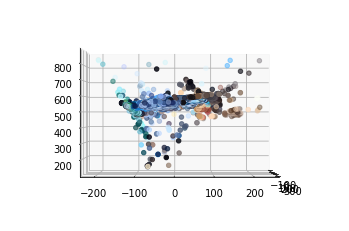

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation

out_points = total_points.reshape(-1, 3) * 200
out_colors = total_colors.reshape(-1, 3)
verts = np.hstack([out_points, out_colors])

mean = np.mean(verts[:, :3], axis=0)
scaled_verts = verts[:, :3] - mean
dist = np.sqrt(scaled_verts[:, 0] ** 2 + scaled_verts[:, 1] ** 2 + scaled_verts[:, 2] ** 2)
indx = np.where(dist < np.mean(dist) + 300)
verts = verts[indx]

points = verts[:, :3]
colors = verts[:, 3:] / 255.

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot the points with colors
scatter = ax.scatter(points[:, 0], points[:, 1], points[:, 2], c=colors)

def update(angle):
    ax.view_init(elev=0., azim=angle)

# Create the animation
ani = FuncAnimation(fig, update, frames=np.linspace(0, 360, 60), interval=50)

# Save the animation as a video file
ani.save('point_cloud_animation.mp4', fps=30)


In [ ]:
from IPython.display import HTML
from base64 import b64encode
mp4 = open('point_cloud_animation.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)